# **Interrogate latent spaces of data with matched samples across sources of variability**

In this notebook, use the full BuDDI model. We will analyze the latent spaces and contrast them against each other. We show that some of the latent spaces are disentangled, but not fully. In this experiment we should have the best disentanglement, because we design our experiment such that we have matched samples across different sources of variation. NOTE: Only CD14 monocytes are perturbed. The reference single-cell profiles are from non-perturbed CD14 monocytes and the task is to deconvolve bulk that has perturbed CD14 monocytes, but all other cell-types are unperturbed.


The data we use is the Kang data. We augment this dataset by modifying the stimulated cells. We only use stimulated monocytes in order to show the specificity in which BuDDI can work. Since the ground truth stimulation provides a global shift in expression, using only one cell type as the perturbed observation shows that BuDDI can truely identify a cell-type specific perturbation.


# **Imports**

In [57]:
# import the VAE code
import sys
sys.path.insert(1, '../../')
sys.path.insert(1, '../')
from buddi import buddi
from buddi.preprocessing import sc_preprocess
from buddi.plotting import validation_plotting as vp


# general imports

import warnings
import numpy as np
import scanpy as sc
from scipy.stats import rankdata
from sklearn.metrics import average_precision_score, f1_score


# Images, plots, display, and visualization
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import scale, MinMaxScaler
from matplotlib_venn import venn2
from upsetplot import from_contents, UpSet

# programming stuff
import time
import os
import pickle
from pathlib import Path

# tensorflow stuff
import tensorflow as tf
from tensorflow.keras.optimizers.legacy import Adam
from tensorflow.keras.utils import to_categorical, normalize, plot_model


# disable eager execution
# https://github.com/tensorflow/tensorflow/issues/47311#issuecomment-786116401
from tensorflow.python.framework.ops import disable_eager_execution
disable_eager_execution()


In [109]:
## parameters
aug_data_path = f"{os.getcwd()}/../data/single_cell_data/augmented_kang_data/"
res_data_path = f"{os.getcwd()}/../results/single_cell_data/buddiM2_simple/"
cibersort_genes_path = (f"{os.getcwd()}/../results/single_cell_data/cibersort_kang/" +
                        "CIBERSORTx_Job17_kang_1_cybersort_sig_inferred_phenoclasses" +
                        ".CIBERSORTx_Job17_kang_1_cybersort_sig_inferred_refsample.bm.K999.txt")

# cibersort results
cibersort_file_path = f"{os.getcwd()}/../results/single_cell_data/cibersort_kang/CIBERSORTx_Job22_Results.csv"
cibersort_path = f"{os.getcwd()}/../data/single_cell_data/cibersort_kang/"

# bp results
bp_res_path = f"{os.getcwd()}/../results/single_cell_data/bp_kang/"

# DiffExp results
de_res_path = f"{os.getcwd()}/../data/single_cell_data/kang_rybakov/kang_DE_paper.tsv"

num_genes = 7000

exp_id = "all-kang"

RETRAIN_MODELS = False

# Set-up experimental variables

In [59]:

##################################################
#####. set up experiment specific variables
##################################################

# number expected cell types
n_cell_types = 10


# number of patients/domains/samples expected
n_tot_samples = 2 # 8 bulk and single cell samples

# number of drugs one-hot encoded
n_drugs = 2

# number of types of sequencing (one-hot encoded)
n_tech = 2

# experiment id
lab_file_name = exp_id


# **Load / Pre-process data**
Import pre-processed pseudobulks

In [309]:
from importlib import reload  # Python 3.4+

reload(sc_preprocess)
reload(vp)


<module 'buddi.plotting.validation_plotting' from '/beevol/home/davidson/checkouts/sc_bulk_ood/kang_analysis/../buddi/plotting/validation_plotting.py'>

In [89]:
# read in the labeled data
X_full, Y_full, gene_df, meta_df = sc_preprocess.read_all_kang_pseudobulk_files_toy_example(aug_data_path, exp_id)
X_full.columns = gene_df


1015
STIM
Train


Test
CTRL
Train
Test
1256
STIM
Train
Test
CTRL
Train
Test


# Define indices and set-up metadata

In [97]:
# we need to make some of the sc_ref into bulk
random_prop_idx = np.where(meta_df.cell_prop_type == "random")[0]
random_prop_idx = np.random.choice(random_prop_idx, int(np.ceil(len(random_prop_idx)/2)), replace=True)

meta_df.iloc[random_prop_idx, meta_df.columns.get_loc("samp_type")] = "bulk"




In [98]:

##################################################
#####. Design the experiment
##################################################


X_orig = np.copy(X_full)

# set up the metadata arrays and indices
samp_label = np.asarray(meta_df.sample_id)
index_label, numeric_label = np.unique(samp_label, return_inverse=True)
Label_full = numeric_label
label_full = to_categorical(numeric_label)

samp_drug = np.asarray(meta_df.stim)
index_drug, numeric_drug = np.unique(samp_drug, return_inverse=True)
Drug_full = numeric_drug
drug_full = to_categorical(numeric_drug)

samp_bulk = np.asarray(meta_df.samp_type)
index_bulk, numeric_bulk = np.unique(samp_bulk, return_inverse=True)
Bulk_full = numeric_bulk
bulk_full = to_categorical(numeric_bulk)


idx_train = np.where(meta_df.isTraining=="Train")[0] 
idx_test = np.where(meta_df.isTraining!="Train")[0] 
idx_bulk = np.where(meta_df.samp_type == "bulk")[0]
idx_sc = np.where(meta_df.samp_type != "bulk")[0]
idx_drug = np.where(meta_df.stim == "STIM")[0]

Y_max = np.copy(Y_full)
Y_max = np.argmax(Y_max, axis=1)
Y_max = Y_full.columns[Y_max]
meta_df["Y_max"] = Y_max

# now seperate out the training and testing data
X_train_df = X_full.iloc[idx_train]
Y_train_df = Y_full.iloc[idx_train]

# only get genes that are available in both testing and training
common_genes_file = os.path.join(aug_data_path, "kang_genes.pkl")
gene_out_path = Path(common_genes_file)
common_genes = pickle.load(open( gene_out_path, "rb" ))

# try using the cibersort genes
cibersort_df = pd.read_csv(cibersort_genes_path, sep="\t" )
cibersort_genes = cibersort_df["NAME"].values.tolist()

# only keep cibersort genes that are in common genes
cibersort_genes = np.intersect1d(common_genes, cibersort_genes)

X_train_df = X_train_df[common_genes]

gene_df = gene_df.loc[gene_df.isin(common_genes)]


# convert to data matrices
X_train = X_train_df.to_numpy()
Y_train = Y_train_df.to_numpy()

## get the top variable genes
X_colmean = X_train.mean(axis=0)
X_colvar = X_train.var(axis=0)
X_CoV = np.array(np.divide(X_colvar, X_colmean+0.001))
idx_top = np.argpartition(X_CoV, -6936)[-6936:]
gene_df = gene_df.iloc[idx_top]


# compare our variable genes with cibersort defined genes

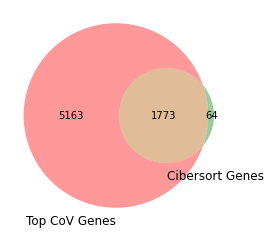

In [100]:

venn2([set(gene_df), set(cibersort_genes)], set_labels = ('Top CoV Genes', 'Cibersort Genes'))
plt.show()

In [101]:
union_genes = np.union1d(gene_df, cibersort_genes)
len(union_genes)

7000

# Normalize data

In [103]:
X_full = X_full.loc[:,union_genes]

## normalize within sample
clip_upper = np.quantile(X_full, 0.9)
X_full = np.clip(X_full, 0, clip_upper)
scaler = MinMaxScaler()
scaler.fit(X_full)

# now normalize with the scaler trained on the 
# training data
X_full = np.clip(X_full, 0, clip_upper)
X_full = scaler.transform(X_full)


# for unknown proportions; 
# this is bulks used in training
X_unkp = X_full[idx_test,]
label_unkp = label_full[idx_test,]
drug_unkp = drug_full[idx_test,]
bulk_unkp = bulk_full[idx_test,]
y_unkp = Y_full.iloc[idx_test]
y_unkp = y_unkp.to_numpy()

# for known proportions
X_kp = X_full[idx_train,]
label_kp = label_full[idx_train,]
drug_kp = drug_full[idx_train,]
bulk_kp = bulk_full[idx_train,]
y_kp = Y_full.iloc[idx_train]
y_kp = y_kp.to_numpy()


# Plot all data

(16000, 2)
(16000, 2)


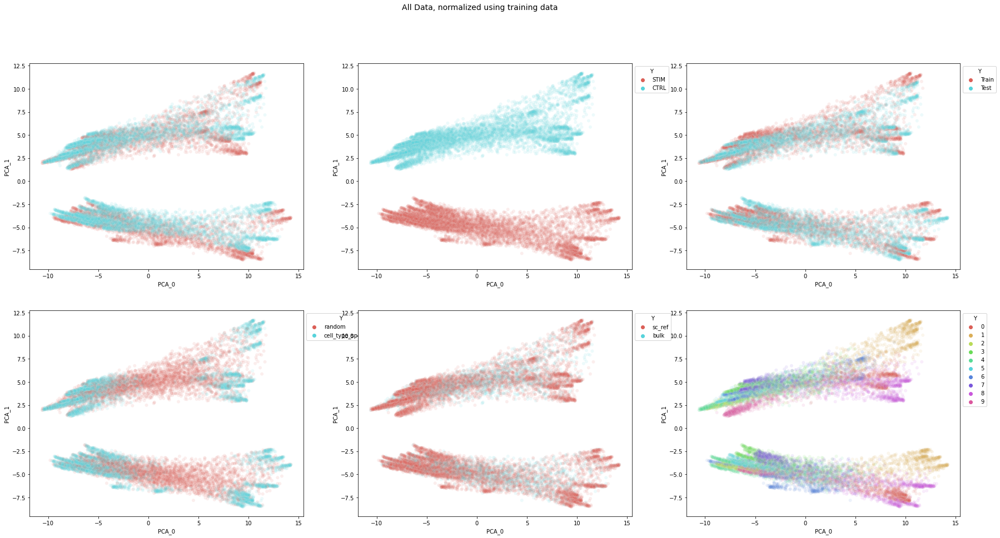

In [334]:
## plot samples
plot_df = vp.get_pca_for_plotting(X_full)

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_pca(plot_df, meta_df.sample_id.to_numpy(), axs[0,0], title=f"")
vp.plot_pca(plot_df, meta_df.stim.to_numpy(), axs[0,1], title=f"")
vp.plot_pca(plot_df, meta_df.isTraining.to_numpy(), axs[0,2], title=f"")
vp.plot_pca(plot_df, meta_df.cell_prop_type.to_numpy(), axs[1,0], title=f"")
vp.plot_pca(plot_df, meta_df.samp_type.to_numpy(), axs[1,1], title=f"")
vp.plot_pca(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 16000 samples in 0.063s...
[t-SNE] Computed neighbors for 16000 samples in 21.173s...
[t-SNE] Computed conditional probabilities for sample 1000 / 16000
[t-SNE] Computed conditional probabilities for sample 2000 / 16000
[t-SNE] Computed conditional probabilities for sample 3000 / 16000
[t-SNE] Computed conditional probabilities for sample 4000 / 16000
[t-SNE] Computed conditional probabilities for sample 5000 / 16000
[t-SNE] Computed conditional probabilities for sample 6000 / 16000
[t-SNE] Computed conditional probabilities for sample 7000 / 16000
[t-SNE] Computed conditional probabilities for sample 8000 / 16000
[t-SNE] Computed conditional probabilities for sample 9000 / 16000
[t-SNE] Computed conditional probabilities for sample 10000 / 16000
[t-SNE] Computed conditional probabilities for sample 11000 / 16000
[t-SNE] Computed conditional probabilities for sample 12000 / 16000
[t-SNE] Computed conditional probabilities for sa

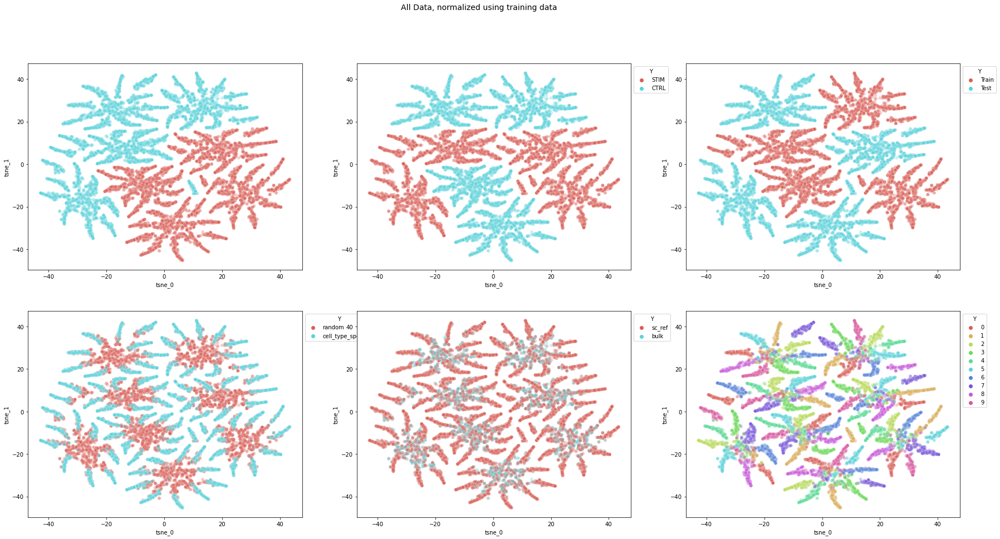

In [104]:
## plot samples
plot_df = vp.get_tsne_for_plotting(X_full)

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_tsne(plot_df, meta_df.sample_id.to_numpy(), axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_df.stim.to_numpy(), axs[0,1], title=f"")
vp.plot_tsne(plot_df, meta_df.isTraining.to_numpy(), axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_df.cell_prop_type.to_numpy(), axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_df.samp_type.to_numpy(), axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


(8000, 2)
(8000, 2)


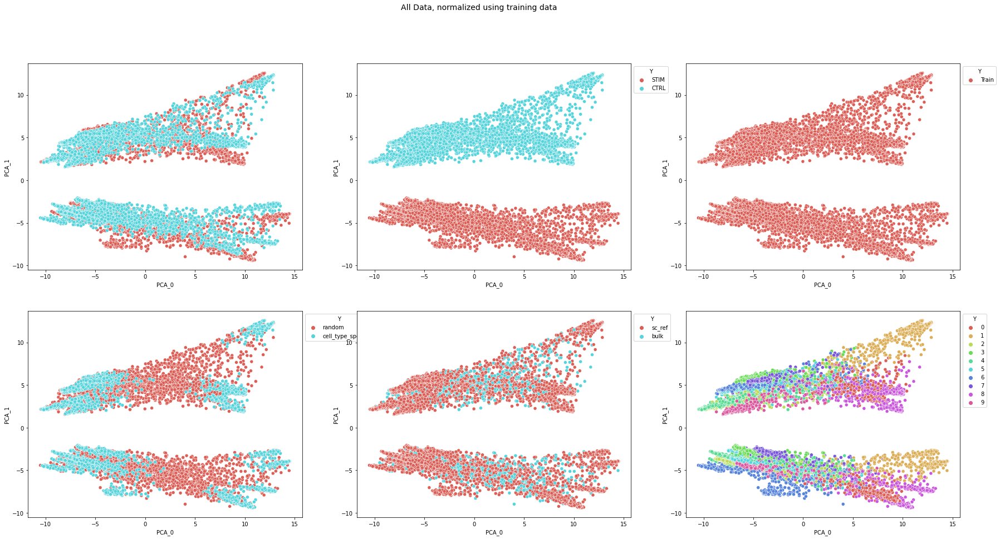

In [105]:
## plot samples
idx_interest = np.where(meta_df.isTraining == "Train")[0]

plot_df = vp.get_pca_for_plotting(X_full[idx_interest])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_interest])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_pca(plot_df, meta_df.sample_id.to_numpy()[idx_interest], axs[0,0], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.stim.to_numpy()[idx_interest], axs[0,1], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.isTraining.to_numpy()[idx_interest], axs[0,2], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.cell_prop_type.to_numpy()[idx_interest], axs[1,0], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.samp_type.to_numpy()[idx_interest], axs[1,1], title=f"", alpha=1)
vp.plot_pca(plot_df, Y_temp, axs[1,2], title=f"", alpha=1)


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


# **Read Models**

Using the hyperparameters learned from using the full BuDDI model, train the restricted BuDDI models

In [106]:
from importlib import reload  # Python 3.4+
reload(buddi)
reload(buddi.buddi4)
reload(sc_preprocess)
reload(vp)

<module 'buddi.plotting.validation_plotting' from '/beevol/home/davidson/checkouts/sc_bulk_ood/kang_analysis/../buddi/plotting/validation_plotting.py'>

In [107]:
bulk_kp

array([[0., 1.],
       [1., 0.],
       [1., 0.],
       ...,
       [0., 1.],
       [0., 1.],
       [0., 1.]], dtype=float32)

In [110]:
curr_n_epoch = 100
if RETRAIN_MODELS: # RETRAIN_MODELS


    params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
                alpha_rot=1000000, alpha_prop=100, 
                alpha_bulk=100, alpha_drug=10000)

    ## model 1
    curr_exp_id = f"model1_{exp_id}"
    res1 = buddi.train_buddi(res_data_path, curr_exp_id, use_buddi4=True, 
                n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
                X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_kp,
                X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

    ## model 2
    curr_exp_id = f"model2_{exp_id}"
    res2 = buddi.train_buddi(res_data_path, curr_exp_id, use_buddi4=True, 
                n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
                X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
                X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

    ## model 3
    curr_exp_id = f"model3_{exp_id}"
    res3 = buddi.train_buddi(res_data_path, curr_exp_id, use_buddi4=True, 
                n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
                X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
                X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)


res1_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/model1_{exp_id}_encoder_unlab")
res1_enc_lab = tf.keras.models.load_model(f"{res_data_path}/model1_{exp_id}_encoder_lab")
res1_dec = tf.keras.models.load_model(f"{res_data_path}/model1_{exp_id}_decoder")
res1_classifier = tf.keras.models.load_model(f"{res_data_path}/model1_{exp_id}_classifier")


res2_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/model2_{exp_id}_encoder_unlab")
res2_enc_lab = tf.keras.models.load_model(f"{res_data_path}/model2_{exp_id}_encoder_lab")
res2_dec = tf.keras.models.load_model(f"{res_data_path}/model2_{exp_id}_decoder")
res2_classifier = tf.keras.models.load_model(f"{res_data_path}/model2_{exp_id}_classifier")


res3_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/model3_{exp_id}_encoder_unlab")
res3_enc_lab = tf.keras.models.load_model(f"{res_data_path}/model3_{exp_id}_encoder_lab")
res3_dec = tf.keras.models.load_model(f"{res_data_path}/model3_{exp_id}_decoder")
res3_classifier = tf.keras.models.load_model(f"{res_data_path}/model3_{exp_id}_classifier")

# **Plot latent spaces**

### plot all latent spaces

/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/decomposition/_pca.py:595: RuntimeWarning: divide by zero encountered in divide
  self.explained_variance_ratio_ = self.explained_variance_ / total_var.sum()


(1500, 2)
(1500, 2)


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)


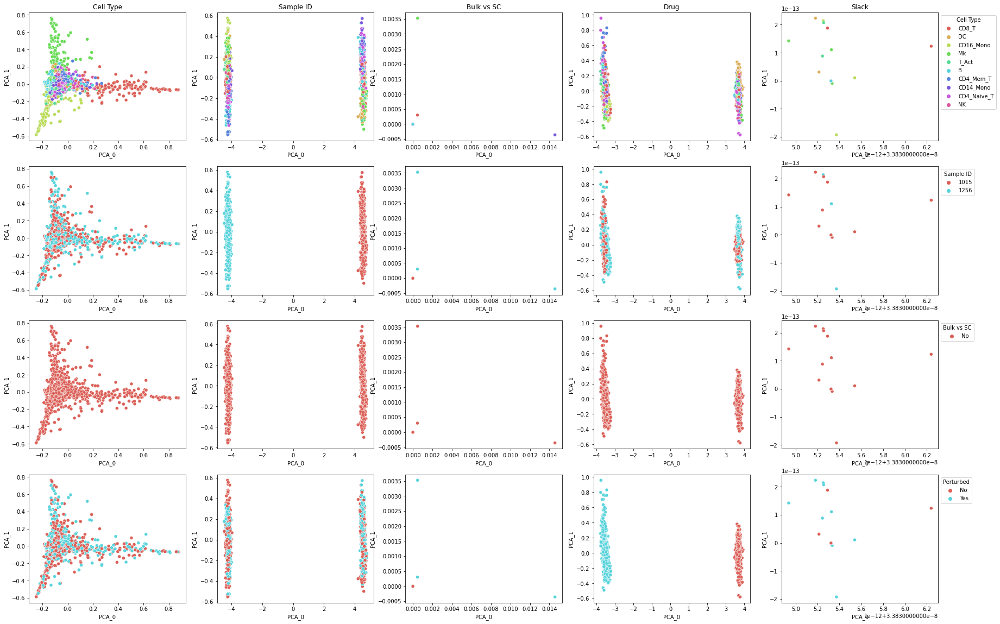

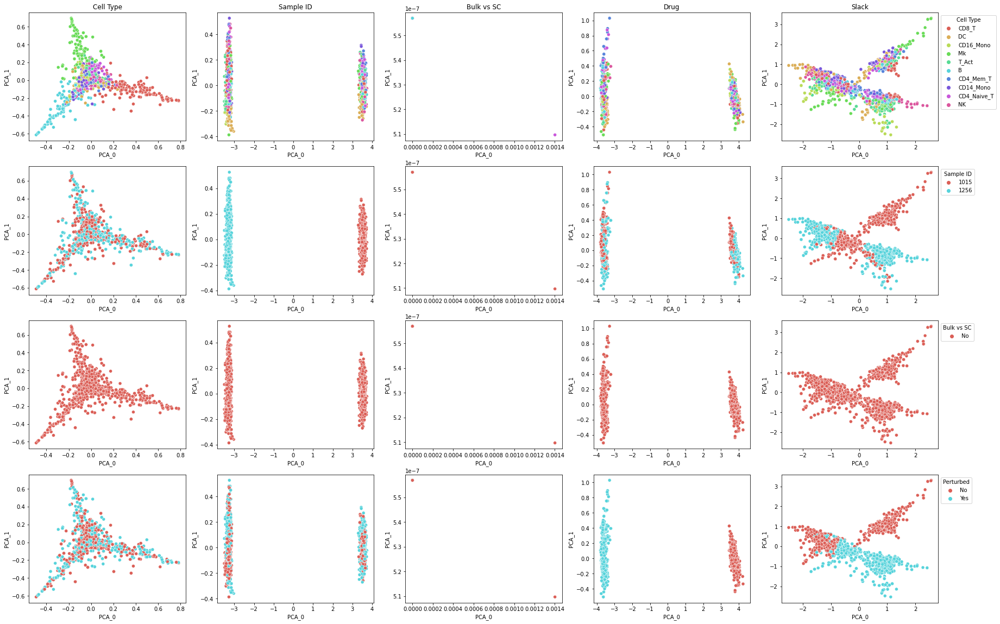

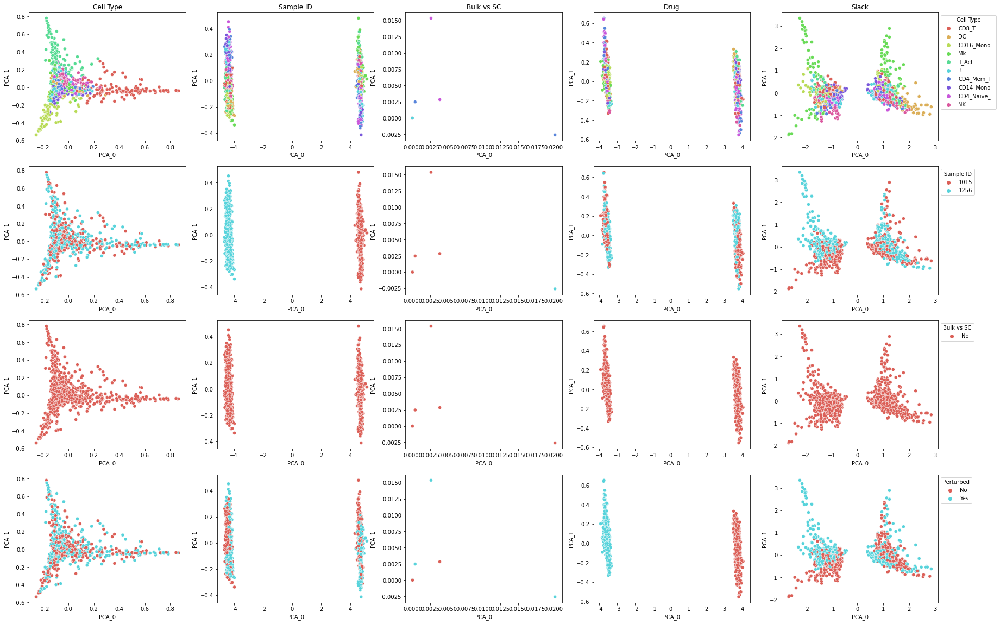

In [114]:
# now plot with predictions
# cell type proportion labels
idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.samp_type == "bulk"))[0]
idx_tmp = np.random.choice(idx_tmp, 1500, replace=True)

X_temp = np.copy(X_full)
X_temp = X_temp[idx_tmp,]


# make predictions
prop_outputs = res1_classifier.predict(X_temp, batch_size=500)
Y_temp = np.copy(prop_outputs)
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_full.columns[Y_temp]

label_temp = np.copy(Label_full)
label_temp = label_temp[idx_tmp]
label_temp = index_label[label_temp]

perturb_temp =np.copy(Drug_full)
perturb_temp = perturb_temp[idx_tmp]


bulk_temp = np.copy(Bulk_full)
bulk_temp = bulk_temp[idx_tmp]

# format
perturb_temp_str = ["Yes" if x else "No" for x in perturb_temp]
bulk_temp_str = ["Yes" if x else "No" for x in bulk_temp]


res1_latent_plot = buddi.plot_latent_spaces(res1_enc_unlab, res1_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp_str, bulk_temp_str, 
                        batch_size=500, use_buddi4=True)


res2_latent_plot = buddi.plot_latent_spaces(res2_enc_unlab, res2_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp_str, bulk_temp_str, 
                        batch_size=500, use_buddi4=True)


res3_latent_plot = buddi.plot_latent_spaces(res3_enc_unlab, res3_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp_str, bulk_temp_str, 
                        batch_size=500, use_buddi4=True)

(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/decomposition/_pca.py:595: RuntimeWarning: divide by zero encountered in divide
  self.explained_variance_ratio_ = self.explained_variance_ / total_var.sum()


(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)


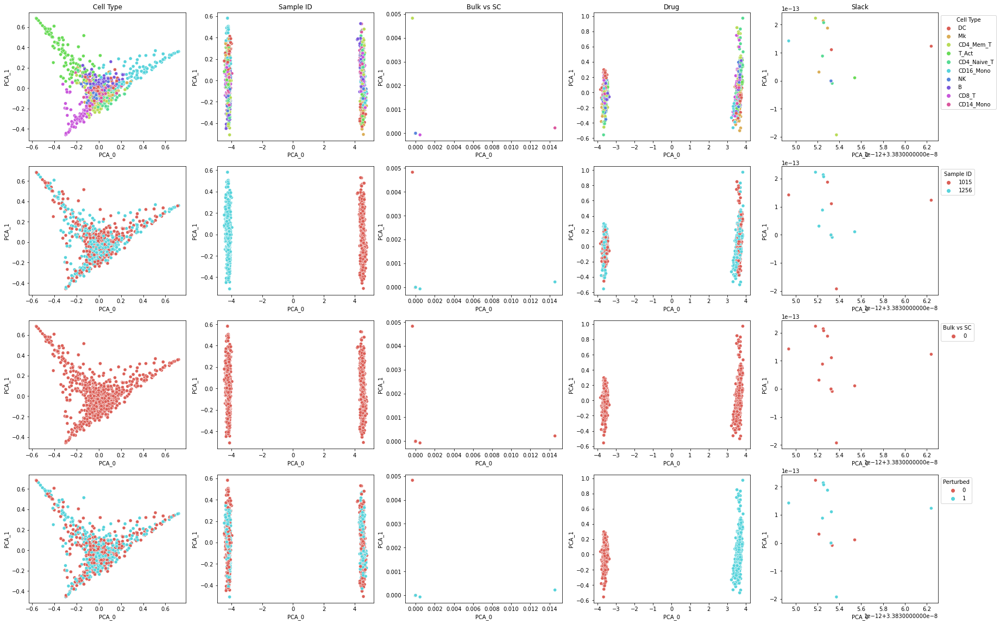

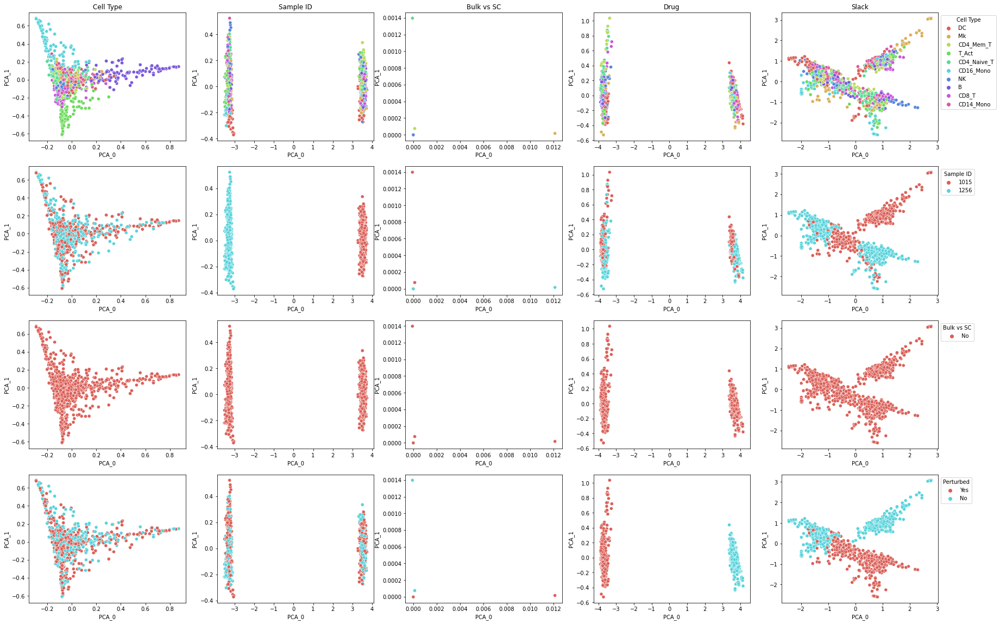

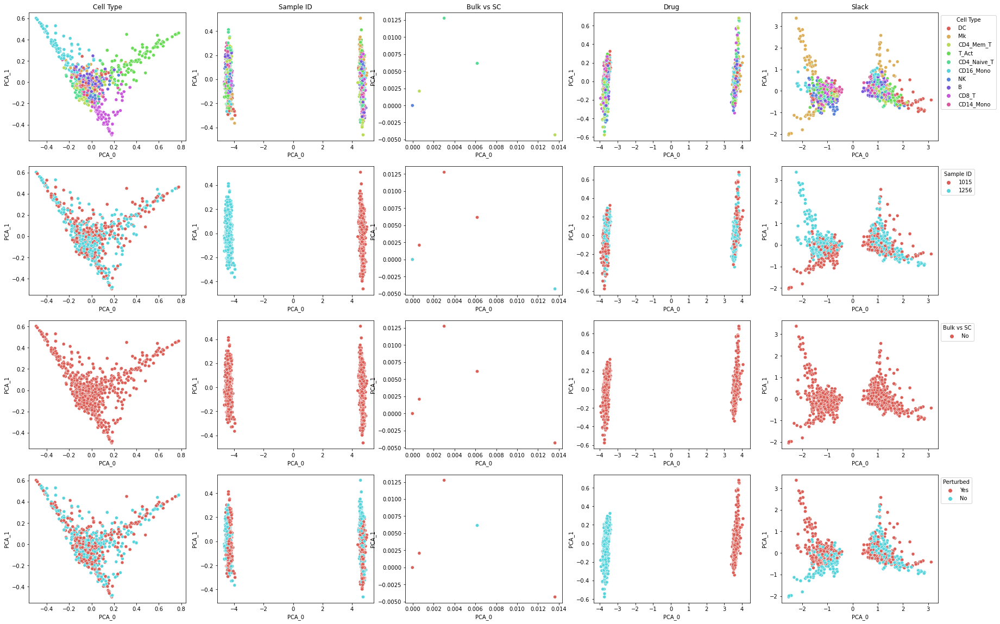

In [115]:
# now plot with ground truth
# cell type proportion labels
idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.samp_type == "bulk"))[0]
idx_tmp = np.random.choice(idx_tmp, 1500, replace=True)

X_temp = np.copy(X_full)
X_temp = X_temp[idx_tmp,]


Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_temp[idx_tmp]
Y_temp = Y_full.columns[Y_temp]

label_temp = np.copy(Label_full)
label_temp = label_temp[idx_tmp]
label_temp = index_label[label_temp]

perturb_temp =np.copy(Drug_full)
perturb_temp = perturb_temp[idx_tmp]


bulk_temp =np.copy(Bulk_full)
bulk_temp = bulk_temp[idx_tmp]

# format
perturb_temp_str = ["Yes" if x else "No" for x in perturb_temp]
bulk_temp_str = ["Yes" if x else "No" for x in bulk_temp]


res1_latent_plot = buddi.plot_latent_spaces(res1_enc_unlab, res1_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp, bulk_temp, 
                        batch_size=500, use_buddi4=True)


res2_latent_plot = buddi.plot_latent_spaces(res2_enc_unlab, res2_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp_str, bulk_temp_str, 
                        batch_size=500, use_buddi4=True)


res3_latent_plot = buddi.plot_latent_spaces(res3_enc_unlab, res3_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp_str, bulk_temp_str, 
                        batch_size=500, use_buddi4=True)

### plot all latent spaces and all training data

(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)


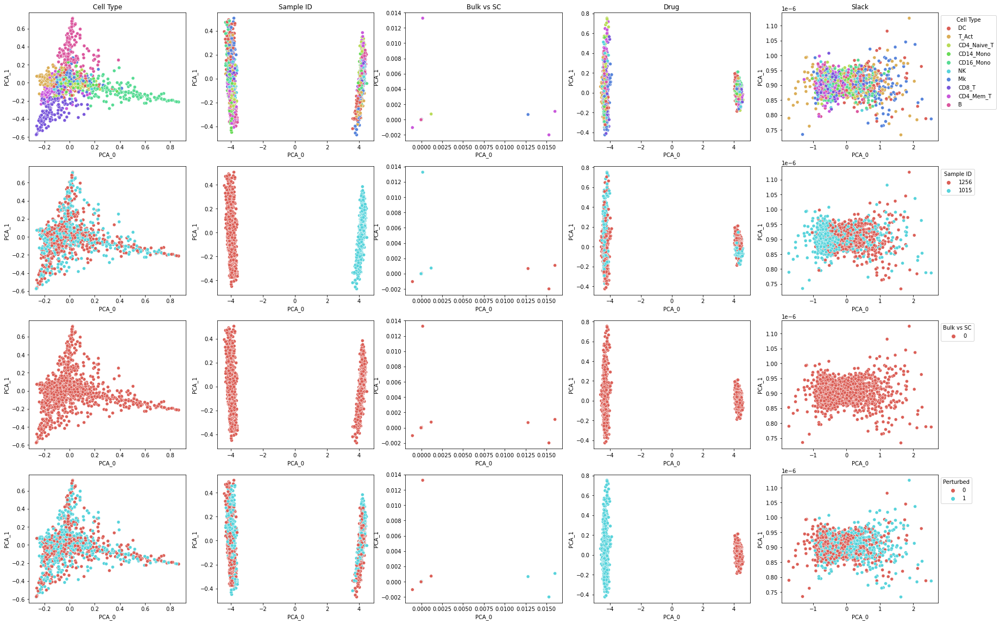

In [287]:
# Now predict
idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.samp_type == "bulk"))[0]
idx_tmp = np.random.choice(idx_tmp, 1500, replace=False)


X_temp = np.copy(X_full)
X_temp = X_temp[idx_tmp,]


Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_temp[idx_tmp]
Y_temp = Y_full.columns[Y_temp]

label_temp = np.copy(Label_full)
label_temp = label_temp[idx_tmp]
label_temp = index_label[label_temp]

perturb_temp =np.copy(Drug_full)
perturb_temp = perturb_temp[idx_tmp]


bulk_temp =np.copy(Bulk_full)
bulk_temp = bulk_temp[idx_tmp]

# format
perturb_temp_str = ["Yes" if x else "No" for x in perturb_temp]
bulk_temp_str = ["Yes" if x else "No" for x in bulk_temp]


res1_latent_plot = buddi.plot_latent_spaces(res1_enc_unlab, res1_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp, bulk_temp, 
                        batch_size=500, use_buddi4=True, use_pca=True)


(1500, 2)
(1500, 2)


(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)


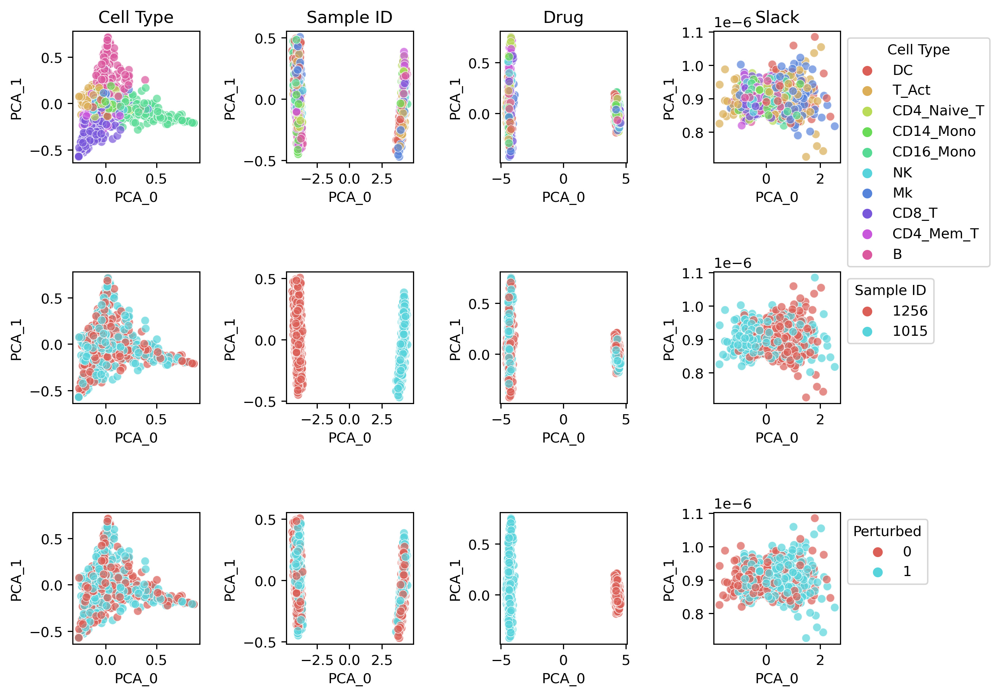

In [318]:

z_slack, mu_slack, _, z_rot, mu_rot, _, z_drug, mu_drug, _, z_bulk, mu_bulk, _ = res1_enc_unlab.predict(X_temp, batch_size=500)
prop_outputs = res1_classifier.predict(X_temp, batch_size=500)

# now concatenate together
z_concat = np.hstack([z_slack, prop_outputs, z_rot, z_drug, z_bulk])


fig, axs = plt.subplots(3, 4, figsize=(10,7), dpi=260)

alpha=0.7
plot_df = vp.get_pca_for_plotting(np.asarray(prop_outputs))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[0,0], title="Cell Type", alpha=alpha, legend_title="Cell Type")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[1,0], title="", alpha=alpha, legend_title="Sample ID")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[2,0], title="", alpha=alpha, legend_title="Perturbed")

plot_df = vp.get_pca_for_plotting(np.asarray(mu_rot))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[0,1], title="Sample ID", alpha=alpha, legend_title="Cell Type")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[1,1], title="", alpha=alpha, legend_title="Sample ID")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[2,1], title="", alpha=alpha, legend_title="Perturbed")

plot_df = vp.get_pca_for_plotting(np.asarray(mu_drug))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[0,2], title="Drug", alpha=alpha, legend_title="Cell Type")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[1,2], title="", alpha=alpha, legend_title="Sample ID")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[2,2], title="", alpha=alpha, legend_title="Perturbed")


plot_df = vp.get_pca_for_plotting(np.asarray(mu_slack))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[0,3], title="Slack", alpha=alpha, legend_title="Cell Type")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[1,3], title="", alpha=alpha, legend_title="Sample ID")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[2,3], title="", alpha=alpha, legend_title="Perturbed")


count_idx = 0
for ax1 in axs:
    inner_count_idx = 0
    for ax2 in ax1:
        if inner_count_idx < 3:
            ax2.get_legend().remove()
        inner_count_idx = inner_count_idx + 1

    count_idx = count_idx + 1

fig.tight_layout()


(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)


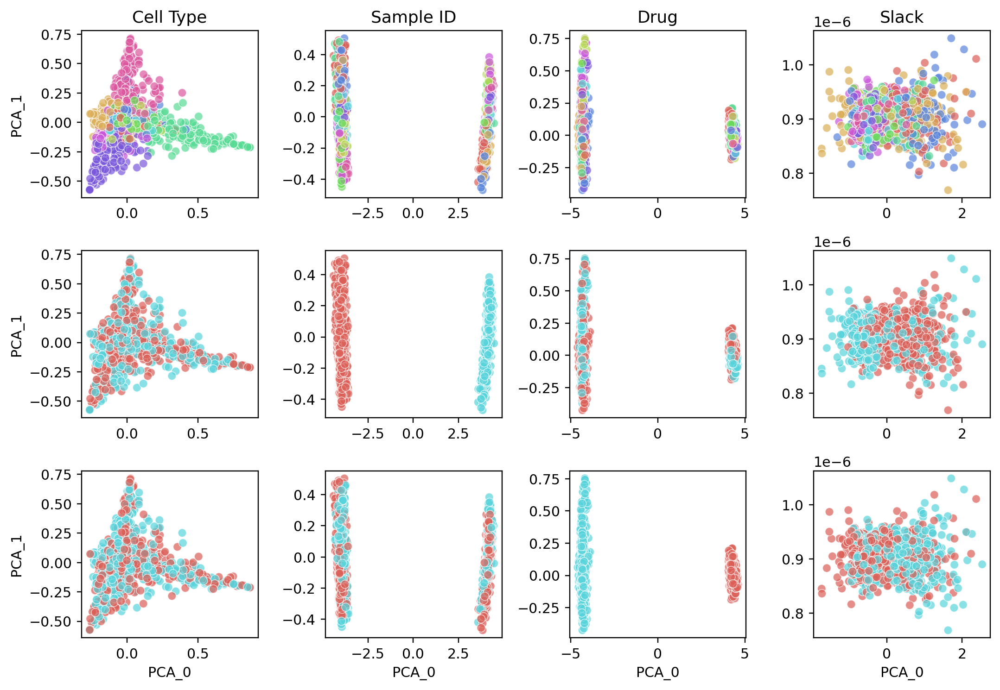

In [317]:

z_slack, mu_slack, _, z_rot, mu_rot, _, z_drug, mu_drug, _, z_bulk, mu_bulk, _ = res1_enc_unlab.predict(X_temp, batch_size=500)
prop_outputs = res1_classifier.predict(X_temp, batch_size=500)

# now concatenate together
z_concat = np.hstack([z_slack, prop_outputs, z_rot, z_drug, z_bulk])


fig, axs = plt.subplots(3, 4, figsize=(10,7), dpi=216)

alpha=0.7
plot_df = vp.get_pca_for_plotting(np.asarray(prop_outputs))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[0,0], title="Cell Type", alpha=alpha, legend_title="Cell Type")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[1,0], title="", alpha=alpha, legend_title="Sample ID")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[2,0], title="", alpha=alpha, legend_title="Perturbed")

plot_df = vp.get_pca_for_plotting(np.asarray(mu_rot))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[0,1], title="Sample ID", alpha=alpha, legend_title="Cell Type")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[1,1], title="", alpha=alpha, legend_title="Sample ID")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[2,1], title="", alpha=alpha, legend_title="Perturbed")

plot_df = vp.get_pca_for_plotting(np.asarray(mu_drug))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[0,2], title="Drug", alpha=alpha, legend_title="Cell Type")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[1,2], title="", alpha=alpha, legend_title="Sample ID")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[2,2], title="", alpha=alpha, legend_title="Perturbed")


plot_df = vp.get_pca_for_plotting(np.asarray(mu_slack))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[0,3], title="Slack", alpha=alpha, legend_title="Cell Type")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[1,3], title="", alpha=alpha, legend_title="Sample ID")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[2,3], title="", alpha=alpha, legend_title="Perturbed")


count_idx = 0
for ax1 in axs:
    inner_count_idx = 0
    for ax2 in ax1:
        x_axis = ax2.axes.get_xaxis()
        y_axis = ax2.axes.get_yaxis()
        ax2.get_legend().remove()

        if inner_count_idx != 0:
            y_label = y_axis.get_label()
            y_label.set_visible(False)

        if count_idx < 2:
            x_label = x_axis.get_label()
            x_label.set_visible(False)

        inner_count_idx = inner_count_idx + 1

    count_idx = count_idx + 1

fig.tight_layout()


(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)
(1500, 2)


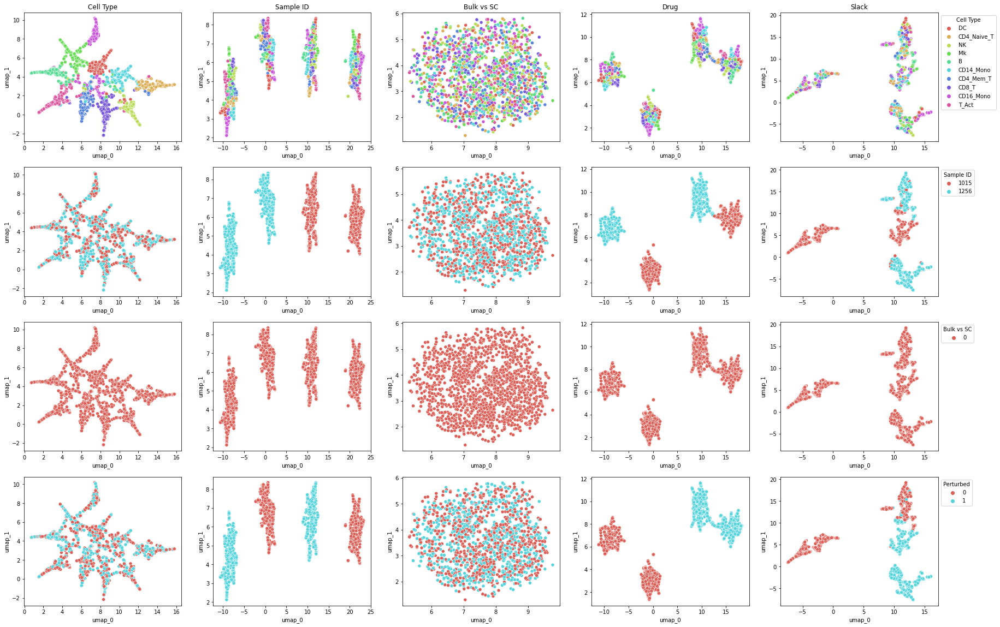

In [168]:
# Now predict
idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.samp_type == "bulk"))[0]
idx_tmp = np.random.choice(idx_tmp, 1500, replace=False)


X_temp = np.copy(X_full)
X_temp = X_temp[idx_tmp,]


Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_temp[idx_tmp]
Y_temp = Y_full.columns[Y_temp]

label_temp = np.copy(Label_full)
label_temp = label_temp[idx_tmp]
label_temp = index_label[label_temp]

perturb_temp =np.copy(Drug_full)
perturb_temp = perturb_temp[idx_tmp]


bulk_temp =np.copy(Bulk_full)
bulk_temp = bulk_temp[idx_tmp]

# format
perturb_temp_str = ["Yes" if x else "No" for x in perturb_temp]
bulk_temp_str = ["Yes" if x else "No" for x in bulk_temp]


res2_latent_plot = buddi.plot_latent_spaces(res2_enc_unlab, res2_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp, bulk_temp, 
                        batch_size=500, use_buddi4=True, use_pca=False)


(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/decomposition/_pca.py:595: RuntimeWarning: divide by zero encountered in divide
  self.explained_variance_ratio_ = self.explained_variance_ / total_var.sum()


(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)


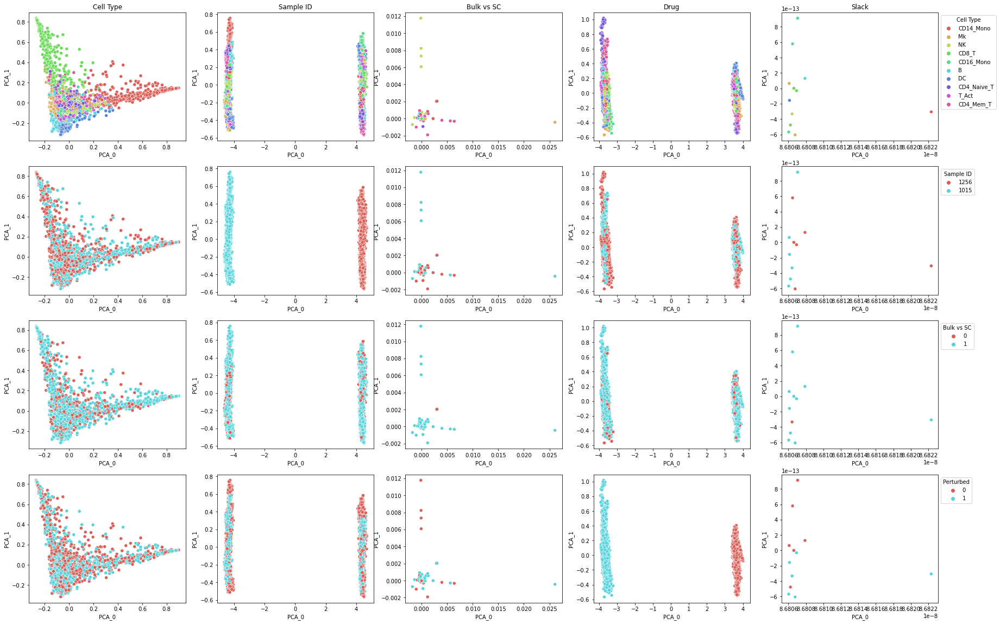

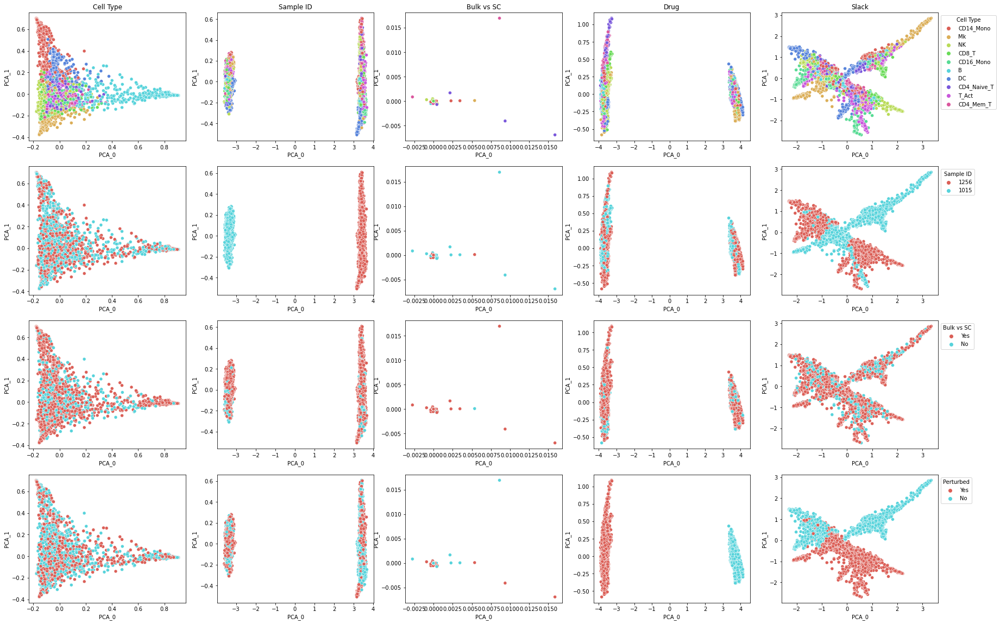

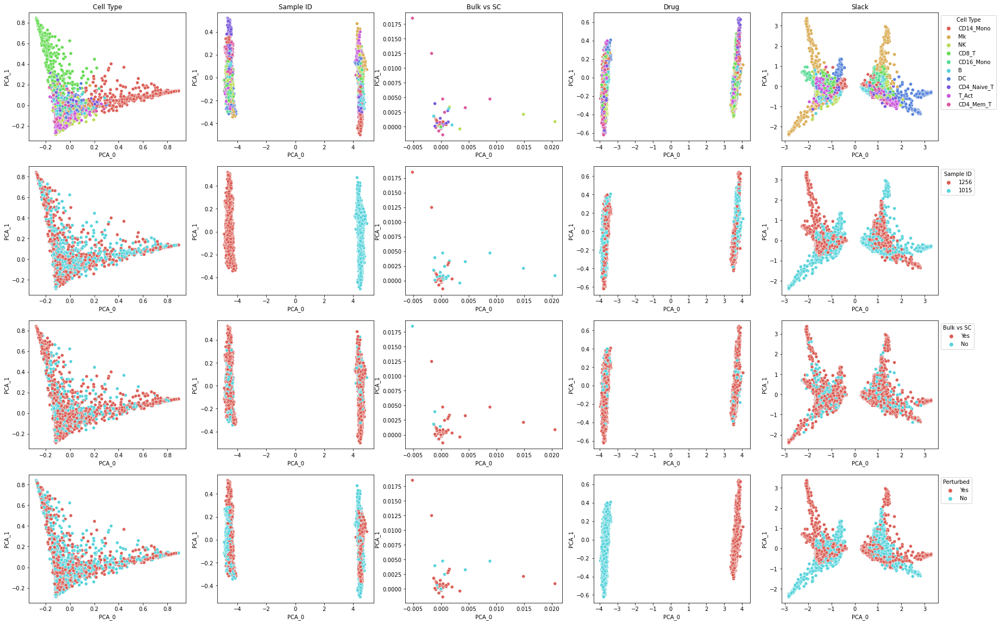

In [116]:
# now plot with ground truth
# cell type proportion labels
idx_tmp = np.where(meta_df.isTraining == "Train")[0]
idx_tmp = np.random.choice(idx_tmp, 4000, replace=False)

X_temp = np.copy(X_full)
X_temp = X_temp[idx_tmp,]


Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_temp[idx_tmp]
Y_temp = Y_full.columns[Y_temp]

label_temp = np.copy(Label_full)
label_temp = label_temp[idx_tmp]
label_temp = index_label[label_temp]

perturb_temp =np.copy(Drug_full)
perturb_temp = perturb_temp[idx_tmp]


bulk_temp =np.copy(Bulk_full)
bulk_temp = bulk_temp[idx_tmp]

# format
perturb_temp_str = ["Yes" if x else "No" for x in perturb_temp]
bulk_temp_str = ["Yes" if x else "No" for x in bulk_temp]


res1_latent_plot = buddi.plot_latent_spaces(res1_enc_unlab, res1_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp, bulk_temp, 
                        batch_size=500, use_buddi4=True)

res2_latent_plot = buddi.plot_latent_spaces(res2_enc_unlab, res2_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp_str, bulk_temp_str, 
                        batch_size=500, use_buddi4=True)


res3_latent_plot = buddi.plot_latent_spaces(res3_enc_unlab, res3_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp_str, bulk_temp_str, 
                        batch_size=500, use_buddi4=True)

# **Get RF prediction scores**

In [335]:
# NOW predict most abundant cell type
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.naive_bayes import GaussianNB

def run_RF(X_in, Y_in):

    sss = StratifiedShuffleSplit(n_splits=2, test_size=0.3, random_state=0)
    _, index = sss.split(X_in, Y_in)
    x_rf_train, y_rf_train = X_in[index[1]], Y_in[index[1]]
    x_rf_test, y_rf_test = X_in[index[0]], Y_in[index[0]]

    clf = RandomForestClassifier(random_state=0)
    clf.fit(x_rf_train, y_rf_train)
    y_rf_pred = clf.predict(x_rf_test)
    out_f1 = np.median(f1_score(y_rf_test, y_rf_pred, average=None))

    return out_f1

def run_NB(X_in, Y_in):

    sss = StratifiedShuffleSplit(n_splits=2, test_size=0.1, random_state=0)
    _, index = sss.split(X_in, Y_in)
    x_rf_train, y_rf_train = X_in[index[1]], Y_in[index[1]]
    x_rf_test, y_rf_test = X_in[index[0]], Y_in[index[0]]

    clf = GaussianNB()
    clf.fit(x_rf_train, y_rf_train)
    y_rf_pred = clf.predict(x_rf_test)
    out_f1 = np.median(f1_score(y_rf_test, y_rf_pred, average=None))

    return out_f1

def run_buddi4_RF(enc_unlab, classifier, 
                  X_tmp, Y_temp, label_temp, perturb_temp, bulk_temp):

    # get encodings
    z_slack, mu_slack, _, z_rot, mu_rot, _, z_drug, mu_drug, _, z_bulk, mu_bulk, _  = enc_unlab.predict(X_tmp, batch_size=500)

    # make predictions
    prop_outputs = classifier.predict(X_tmp, batch_size=500)



    ########
    ## using drug_outputs
    ########

    prop_y_f1 = run_NB(prop_outputs, Y_temp)
    prop_lab_f1 = run_NB(prop_outputs, label_temp)
    prop_pert_f1 = run_NB(prop_outputs, perturb_temp)

    ########
    ## using mu_rot
    ########

    samp_y_f1 = run_NB(mu_rot, Y_temp)
    samp_lab_f1 = run_NB(mu_rot, label_temp)
    samp_pert_f1 = run_NB(mu_rot, perturb_temp)


    ########
    ## using mu_drug
    ########

    drug_y_f1 = run_NB(mu_drug, Y_temp)
    drug_lab_f1 = run_NB(mu_drug, label_temp)
    drug_pert_f1 = run_NB(mu_drug, perturb_temp)


    ########
    ## using mu_drug
    ########

    slack_y_f1 = run_NB(mu_slack, Y_temp)
    slack_lab_f1 = run_NB(mu_slack, label_temp)
    slack_pert_f1 = run_NB(mu_slack, perturb_temp)


    rf_f1_df = pd.DataFrame(np.array([[prop_y_f1, prop_lab_f1, prop_pert_f1], 
                                        [samp_y_f1, samp_lab_f1, samp_pert_f1], 
                                        [drug_y_f1, drug_lab_f1, drug_pert_f1], 
                                        [slack_y_f1, slack_lab_f1, slack_pert_f1]]),
                    columns=["cell_type", "sample_id", "perturbed"])
    
    rf_f1_df = rf_f1_df.transpose()
    rf_f1_df.columns = ["cell_type", "sample_id", "perturbed","slack"]

    return rf_f1_df


In [279]:
idx_tmp = np.where(meta_df.isTraining == "Test")[0]
len(idx_tmp)

8000

In [336]:
# Now predict
idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Test", meta_df.samp_type == "bulk"))[0]
idx_tmp = np.where(meta_df.isTraining == "Test")[0]
idx_tmp = np.random.choice(idx_tmp, 8000, replace=False)


X_tmp = X_full[idx_tmp,]

# get the labels of interest for prediction
# then make 1-hot encoded
Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_temp[idx_tmp]

Y_temp_1hot = np.zeros((Y_temp.size, Y_temp.max() + 1))
Y_temp_1hot[np.arange(Y_temp.size), Y_temp] = 1

label_temp = np.copy(Label_full)
label_temp = label_temp[idx_tmp]
label_temp_1hot = np.zeros((label_temp.size, label_temp.max() + 1))
label_temp_1hot[np.arange(label_temp.size), label_temp] = 1


perturb_temp =np.copy(Drug_full)
perturb_temp = perturb_temp[idx_tmp]
perturb_temp_1hot = np.zeros((perturb_temp.size, perturb_temp.max() + 1))
perturb_temp_1hot[np.arange(perturb_temp.size), perturb_temp] = 1


bulk_temp =np.copy(Bulk_full)
bulk_temp = bulk_temp[idx_tmp]
bulk_temp_1hot = np.zeros((bulk_temp.size, bulk_temp.max() + 1))
bulk_temp_1hot[np.arange(bulk_temp.size), bulk_temp] = 1

for curr_idx in range(10):
    rf1_f1_df = run_buddi4_RF(res1_enc_unlab, res1_classifier, 
                    X_tmp, Y_temp, label_temp, perturb_temp, bulk_temp)


    rf2_f1_df = run_buddi4_RF(res2_enc_unlab, res2_classifier, 
                    X_tmp, Y_temp, label_temp, perturb_temp, bulk_temp)


    rf3_f1_df = run_buddi4_RF(res3_enc_unlab, res3_classifier, 
                    X_tmp, Y_temp, label_temp, perturb_temp, bulk_temp)

    if curr_idx == 0:
        rf_f1_df = rf1_f1_df+rf2_f1_df+rf3_f1_df
    else:
        rf_f1_df = rf_f1_df+rf1_f1_df+rf2_f1_df+rf3_f1_df



rf_f1_df = rf_f1_df/30

In [337]:
rf_f1_df

,cell_type,sample_id,perturbed,slack
cell_type,0.884676,0.332483,0.308315,0.348706
sample_id,0.604661,1.000000,0.507421,0.592772
perturbed,0.550413,0.577058,1.000000,0.547794


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3430: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


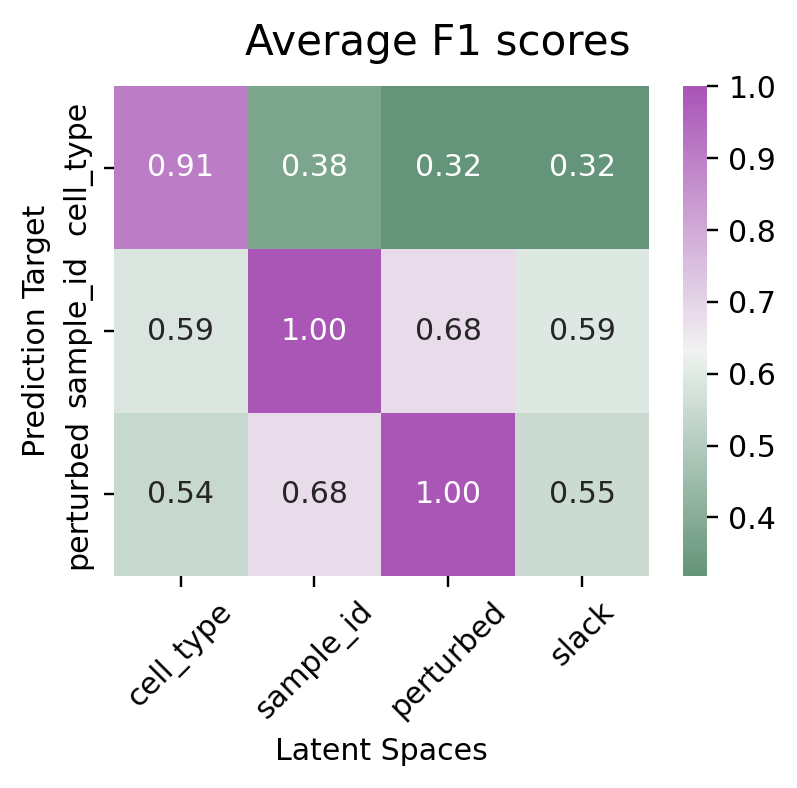

In [324]:
fig, axs = plt.subplots(1, figsize=(4,3), dpi=216)

sns.heatmap(rf_f1_df, annot=True, fmt=".2f", ax=axs, center=np.mean(np.mean(rf_f1_df)), cmap=sns.diverging_palette(145, 300, s=60, as_cmap=True))
axs.set_xlabel('Latent Spaces')
axs.set_ylabel('Prediction Target')
fig.suptitle("Average F1 scores", fontsize=14)
axs.tick_params(axis='x', rotation=45)


# **Plot deconvolution estimates**


Here, we will plot the estimates of the bulks we used in training that were either labeled (CTRL samples) or unlabeled (STIM samples).

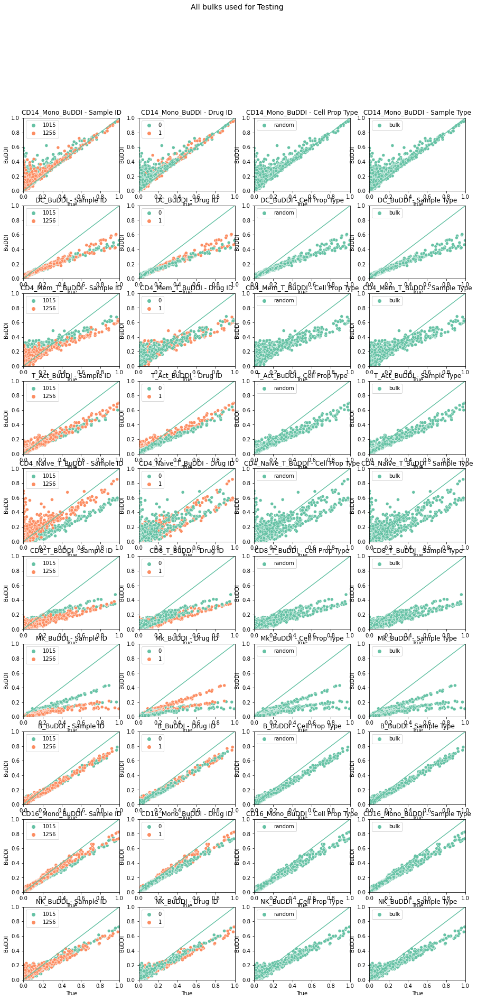

In [284]:
idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Test", meta_df.samp_type == "bulk"))[0]
X_tmp = X_full[idx_tmp,]

# make predictions
prop_outputs = res1_classifier.predict(X_tmp, batch_size=500)

## plot for the unlabeled

prop_df = pd.DataFrame(prop_outputs, columns=Y_full.columns)
true_prop_df = Y_full.iloc[idx_tmp]

label_temp = np.copy(Label_full)
label_temp = index_label[label_temp]



fig, axs = plt.subplots(10, 4, figsize=(15,30))
row_idx = 0
for curr_cell in true_prop_df.columns:

    vp.plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,0], title=f"{curr_cell}_BuDDI - Sample ID", xlab="True", ylab="BuDDI", class_id=label_temp[idx_tmp])
    vp.plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,1], title=f"{curr_cell}_BuDDI - Drug ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    vp.plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,2], title=f"{curr_cell}_BuDDI - Cell Prop Type", xlab="True", ylab="BuDDI", class_id=meta_df.cell_prop_type.to_numpy()[idx_tmp])
    vp.plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,3], title=f"{curr_cell}_BuDDI - Sample Type", xlab="True", ylab="BuDDI", class_id=meta_df.samp_type.to_numpy()[idx_tmp])
    row_idx = row_idx +1


fig.suptitle("All bulks used for Testing", fontsize=14)

fig.show()



In [285]:
from scipy.stats import spearmanr, pearsonr

# helper methods for evaluation
def sum_abs_error(y_pred, y_true):
  return sum(abs(y_pred - y_true))

def mean_abs_error(y_pred, y_true):
  return np.mean(abs(y_pred - y_true))

def mean_sqr_error(y_pred, y_true):
  return np.mean((y_pred - y_true)**2)

def get_errors(y_true, y_est):
  mse_err = [mean_sqr_error(y_true[idx], y_est[idx]) 
                  for idx in range(0, y_est.shape[0])]

  print(f"MSqE mean: {np.mean(mse_err)}, median: {np.median(mse_err)}, max: {max(mse_err)}")

  spr_err = [spearmanr(y_true[idx].astype(float), y_est[idx].astype(float))[0]
                    for idx in range(0, y_est.shape[0])]
  print(f"Spearman mean: {np.mean(spr_err)}, median: {np.median(spr_err)}, max: {max(spr_err)}")

  pear_err = [pearsonr(y_true[idx].astype(float), y_est[idx].astype(float))[0]
                    for idx in range(0, y_est.shape[0])]
  print(f"Pearson mean: {np.mean(pear_err)}, median: {np.median(pear_err)}, max: {max(pear_err)}")

  error_list = [mse_err, spr_err, pear_err]
  plot_df = [item for sublist in error_list for item in sublist]
  plot_df = pd.DataFrame(plot_df)
  plot_df.columns = ["error"]
  plot_df["error_type"] = ["MSQ"]*y_est.shape[0] + ["SPR"]*y_est.shape[0] + ["PEAR"]*y_est.shape[0]

  return plot_df


### look at BuDDI results alone

MSqE mean: 0.00024795450054119177, median: 0.00021236416132683925, max: 0.0016436368260902934
Spearman mean: 0.8794031113514222, median: 0.9151515151515152, max: 0.9999999999999999
Pearson mean: 0.9930744435929042, median: 0.9958596870671863, max: 0.9999952931935515
MSqE mean: 0.0002966760228427447, median: 0.00025422120573096146, max: 0.001298176656859451
Spearman mean: 0.8697042295496998, median: 0.9030303030303028, max: 0.9999999999999999
Pearson mean: 0.9911263586916405, median: 0.9945099495136863, max: 0.9999956357087625
MSqE mean: 0.00028250384690956703, median: 0.00024592873915120294, max: 0.0011936526914164238
Spearman mean: 0.8889234619275421, median: 0.9272727272727272, max: 0.9999999999999999
Pearson mean: 0.9931178756066096, median: 0.9958756165553356, max: 0.9999968712165107
MSqE mean: 0.00022403208143484792, median: 0.00017591213685979413, max: 0.0014589252140490884
Spearman mean: 0.8749830207929202, median: 0.9151515151515152, max: 0.9999999999999999
Pearson mean: 0.9941

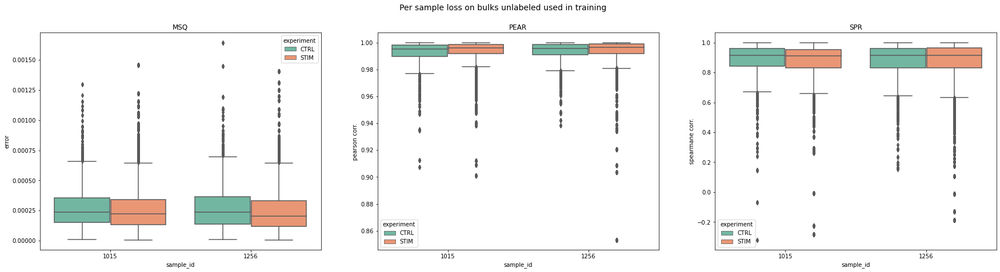

In [327]:


# Now compare across samples
idx_tmp = np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Train")
idx_tmp = np.logical_and(idx_tmp, meta_df.stim == "CTRL")
idx_tmp = np.where( idx_tmp)[0]
idx_tmp = np.random.choice(idx_tmp, 2500, replace=True)


X_tmp = X_full[idx_tmp,]
Y_tmp = Y_full.iloc[idx_tmp]
samp_ids = meta_df.sample_id.iloc[idx_tmp]

# make predictions
# and calculate the error
prop_outputs = res1_classifier.predict(X_tmp, batch_size=500)
buddi_err_ctrl1 = get_errors(Y_tmp.to_numpy(), prop_outputs)

prop_outputs = res2_classifier.predict(X_tmp, batch_size=500)
buddi_err_ctrl2 = get_errors(Y_tmp.to_numpy(), prop_outputs)

prop_outputs = res3_classifier.predict(X_tmp, batch_size=500)
buddi_err_ctrl3 = get_errors(Y_tmp.to_numpy(), prop_outputs)

buddi_err_ctrl = pd.concat([buddi_err_ctrl1, buddi_err_ctrl2, buddi_err_ctrl3])

# format the errors
buddi_err_ctrl["experiment"] = ["CTRL"]*buddi_err_ctrl.shape[0]
buddi_err_ctrl["method"] = ["BuDDI"]*buddi_err_ctrl.shape[0]
buddi_err_ctrl["sample_id"] = np.tile(samp_ids, 9) ###


# Now compare across samples
idx_tmp = np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Train")
idx_tmp = np.logical_and(idx_tmp, meta_df.stim == "STIM")
idx_tmp = np.where( idx_tmp)[0]
idx_tmp = np.tile(idx_tmp, 100)


X_tmp = X_full[idx_tmp,]
Y_tmp = Y_full.iloc[idx_tmp]
samp_ids = meta_df.sample_id.iloc[idx_tmp]

# make predictions
# and calculate the error
prop_outputs = res1_classifier.predict(X_tmp, batch_size=500)
buddi_err_stim1 = get_errors(Y_tmp.to_numpy(), prop_outputs)

prop_outputs = res2_classifier.predict(X_tmp, batch_size=500)
buddi_err_stim2 = get_errors(Y_tmp.to_numpy(), prop_outputs)

prop_outputs = res3_classifier.predict(X_tmp, batch_size=500)
buddi_err_stim3 = get_errors(Y_tmp.to_numpy(), prop_outputs)

buddi_err_stim = pd.concat([buddi_err_stim1, buddi_err_stim2, buddi_err_stim3])

# format the errors
buddi_err_stim["experiment"] = ["STIM"]*buddi_err_stim.shape[0]
buddi_err_stim["method"] = ["BuDDI"]*buddi_err_stim.shape[0]
buddi_err_stim["sample_id"] = np.tile(samp_ids, 9) ###

plot_df = pd.concat([buddi_err_ctrl, buddi_err_stim])



# plot
fig, axs = plt.subplots(1, 3, figsize=(30,7))
sns.boxplot(data=plot_df[plot_df["error_type"] == "MSQ"], 
            x="sample_id", y="error",
            hue="experiment", ax= axs[0])
axs[0].set_title("MSQ")

sns.boxplot(data=plot_df[plot_df["error_type"] == "PEAR"], 
            x="sample_id", y="error",
            hue="experiment", ax= axs[1])
axs[1].set_title("PEAR")
axs[1].set(ylabel="pearson corr.")


sns.boxplot(data=plot_df[plot_df["error_type"] == "SPR"], 
            x="sample_id", y="error",
            hue="experiment", ax= axs[2])
axs[2].set_title("SPR")
axs[2].set(ylabel="spearmane corr.")
fig.suptitle("Per sample loss on bulks unlabeled used in training", fontsize=14)

fig.show()

In [328]:
plot_df

,error,error_type,experiment,method,sample_id
0,0.000185,MSQ,CTRL,BuDDI,1015
1,0.000277,MSQ,CTRL,BuDDI,1256
2,0.000127,MSQ,CTRL,BuDDI,1015
3,0.000218,MSQ,CTRL,BuDDI,1256
4,0.000947,MSQ,CTRL,BuDDI,1015
...,...,...,...,...,...
235495,0.977462,PEAR,STIM,BuDDI,1256
235496,0.992141,PEAR,STIM,BuDDI,1256
235497,0.999133,PEAR,STIM,BuDDI,1256
235498,0.999341,PEAR,STIM,BuDDI,1256


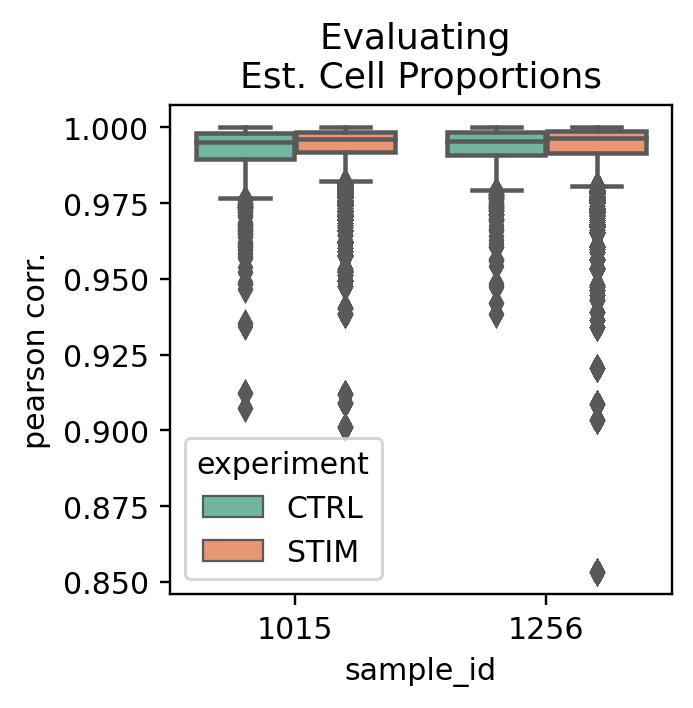

In [332]:

# plot
fig, axs = plt.subplots(1, 1, figsize=(3,3), dpi=216)


sns.boxplot(data=plot_df[plot_df["error_type"] == "PEAR"], 
            x="sample_id", y="error",
            hue="experiment", ax= axs)
axs.set_title("Evaluating \nEst. Cell Proportions")
axs.set(ylabel="pearson corr.")


fig.show()